### Import Libraries

In [8]:
%matplotlib inline

import nibabel as nib
import ants
import numpy as np
import pandas as pd
import os
from math import ceil
import multiprocessing as mp
import re

from scipy.optimize import curve_fit
from scipy.stats.distributions import  t

from nilearn.image import load_img, smooth_img, resample_img, get_data
from nilearn.plotting import show, view_img, plot_img
import intensity_normalization.normalize as norm

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from PIL import Image
from skimage.measure import compare_ssim
import imutils
import cv2
import scipy

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential, model_from_json, Model
from tensorflow.keras.layers import (
    Conv3D,
    MaxPooling3D,
    Conv3DTranspose,
    UpSampling3D,
    BatchNormalization,
    Activation,
    Add,
    Input,
    Lambda,
    Dense,
    Flatten,
    Reshape
)
from tensorflow.keras.utils import plot_model
import tensorflow.keras.losses as losses
from tensorflow_addons.layers import InstanceNormalization

### Define Paths

In [9]:
research_dir = '/media/jraad/Data1/school/research/'
data_dir = os.path.join(research_dir, 'data')
dhcp_dir = os.path.join(data_dir, 'dHCP')
dhcp_norm = os.path.join(dhcp_dir, 'self_normalized')
dhcp_standardized = os.path.join(dhcp_dir, 'standardized')
dhcp_analysis = os.path.join(dhcp_dir, 'analysis')

model_dir = os.path.join(research_dir, 'models', 'new_models')

### Define Plotting and Brain Diff Functions

In [10]:
def viz_before_after(before, title):
    og_img = np.reshape(before, (x, y, z))
    pred_img = model.predict(np.reshape(before, (1, x, y, z, 1)))
    pred_img = np.reshape(pred_img, (x, y, z))
    
    # Plot original and new image
    f, axarr = plt.subplots(3, 2, figsize=(20,30))
    cmap = plt.get_cmap('viridis')
    
    # Define plots
    f.suptitle(title, fontsize=16)
    
    # Middle slice
    z_plot = ceil(pred_img.shape[2]/2)
    axarr[0][0].imshow(np.reshape(og_img[:,:,z_plot], (x, y)), cmap=cmap)
    axarr[0][0].set_title('Original')
    axarr[0][1].imshow(pred_img[:,:,z_plot], cmap=cmap)
    axarr[0][1].set_title('Recreated')
    
    # Early slice
    z_plot = ceil(pred_img.shape[2]/4)
    axarr[1][0].imshow(np.reshape(og_img[:,:,z_plot], (x, y)), cmap=cmap)
    axarr[1][0].set_title('Original')
    axarr[1][1].imshow(pred_img[:,:,z_plot], cmap=cmap)
    axarr[1][1].set_title('Recreated')
    
    # Late slice
    z_plot = ceil(pred_img.shape[2]/4)
    z_plot *= 3
    axarr[2][0].imshow(np.reshape(og_img[:,:,z_plot], (x, y)), cmap=cmap)
    axarr[2][0].set_title('Original')
    axarr[2][1].imshow(pred_img[:,:,z_plot], cmap=cmap)
    axarr[2][1].set_title('Recreated')
    
    return og_img, pred_img

def alpha_curve(ncolors):
    x = np.array([0.5, 0.387, 0.24, 0.136, 0.04, 0.011])
    y = np.array([1.255, 1.25, 1.189, 1.124, 0.783, 0.402]) / 1.255

    # this is the function we want to fit to our data
    def func(x, a, b):
        'nonlinear function in a and b to fit to data'
        return a * x / (b + x)

    initial_guess = [1.2, 0.03]
    pars, pcov = curve_fit(func, x, y, p0=initial_guess)

    linspace = np.linspace(0, 1, ncolors)
    color_alpha = func(linspace, pars[0], pars[1])
    color_alpha /= np.amax(color_alpha)
    
    return color_alpha

def brain_diff(a, b, threshold=3, mean=0, std=0.1):
    ncolors = 256
    
    x, y, z = a.shape
    z_plot = ceil(z / 2)
    
    diff = a - b
    
    diff_scaled = (diff - mean) / std
    
    # Values that fall below the mean/threshold
    below_zero = diff_scaled.copy()
    below_zero[below_zero > -threshold] = 0

    # Values that fall above the mean/threshold
    above_zero = diff_scaled.copy()
    above_zero[above_zero < threshold] = 0
    
    # Log-ish Alpha scale
    color_alpha = alpha_curve(ncolors)
    
    # Above mean colormap
    color_array = plt.get_cmap('Reds')(range(ncolors))
    color_array[:,-1] = color_alpha
    map_object = LinearSegmentedColormap.from_list(name='above_mean',colors=color_array)
    plt.register_cmap(cmap=map_object)

    # Above mean colormap
    color_array = plt.get_cmap('Blues')(range(ncolors))
    color_array = np.flip(color_array, axis=0)
    color_array[:,-1] = np.flip(color_alpha) #np.linspace(1.0,0.0,ncolors)
    map_object = LinearSegmentedColormap.from_list(name='below_mean',colors=color_array)
    plt.register_cmap(cmap=map_object)
    
    # Define plots
    fig, ax = plt.subplots(3, 1, figsize=(20, 30))
    
    # Plot middle slice
    index = 0
    ax[index].imshow(a[:,:,z_plot], cmap='Greys')
    im = ax[index].imshow(above_zero[:,:,z_plot], cmap='above_mean')
    fig.colorbar(im, ax=ax[index])
    im = ax[index].imshow(below_zero[:,:,z_plot], cmap='below_mean')
    fig.colorbar(im, ax=ax[index])
    
    # Plot early slice
    z_plot = ceil(a.shape[2]/4)
    index = 1
    ax[index].imshow(a[:,:,z_plot], cmap='Greys')
    im = ax[index].imshow(above_zero[:,:,z_plot], cmap='above_mean')
    fig.colorbar(im, ax=ax[index])
    im = ax[index].imshow(below_zero[:,:,z_plot], cmap='below_mean')
    fig.colorbar(im, ax=ax[index])
    
    # Plot late slice
    z_plot = ceil(a.shape[2]/4)
    z_plot *= 3
    index = 2
    ax[index].imshow(a[:,:,z_plot], cmap='Greys')
    im = ax[index].imshow(above_zero[:,:,z_plot], cmap='above_mean')
    fig.colorbar(im, ax=ax[index])
    im = ax[index].imshow(below_zero[:,:,z_plot], cmap='below_mean')
    fig.colorbar(im, ax=ax[index])

def build_overlay_image(a, b, threshold=2, mean=0, std =1):
    ncolors = 256

    x, y, z = a.shape
    z_plot = ceil(z / 2)

    diff = a - b

    diff_scaled = (diff - mean) / std 

    # Values that fall below the mean/threshold
    below_zero = diff_scaled.copy()
    below_zero[below_zero > -threshold] = 0
    
    # Values that fall above the mean/threshold
    above_zero = diff_scaled.copy()
    above_zero[above_zero < threshold] = 0
    
    return below_zero, above_zero
    
def generate_prediction(before):
    og_img = np.reshape(before, (x, y, z))
    pred_img = model.predict(np.reshape(before, (1, x, y, z, 1)))
    pred_img = np.reshape(pred_img, (x, y, z))
    
    return og_img, pred_img

### Read Data

In [11]:
dhcp_normal_path = os.path.join(dhcp_standardized, 'dhcp_level1.npy')
dhcp_normal = np.load(dhcp_normal_path)

dhcp_abnormal_path = os.path.join(dhcp_standardized, 'dhcp_level5.npy')
dhcp_abnormal = np.load(dhcp_abnormal_path)

### Visualize Brains

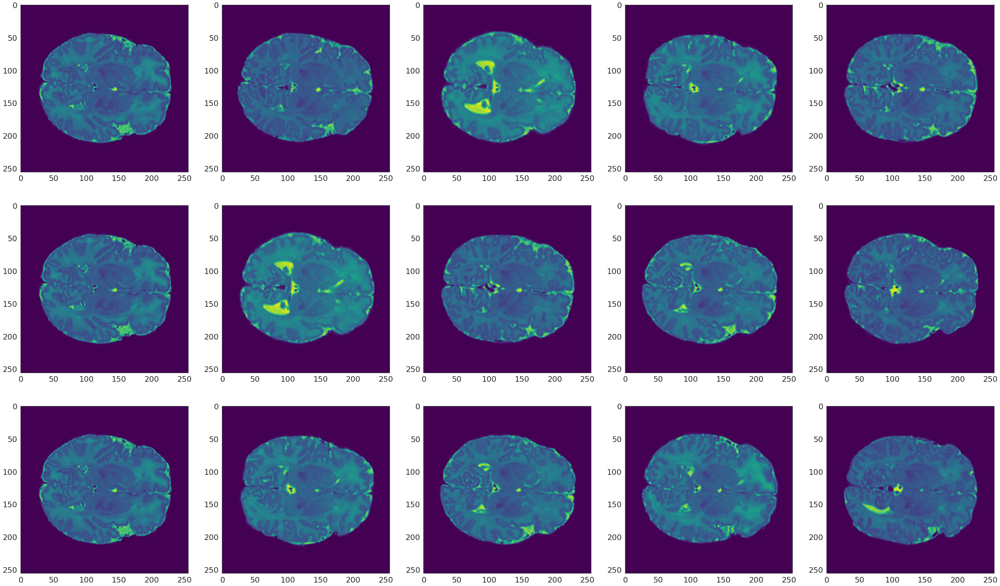

In [6]:
%matplotlib inline

f, axarr = plt.subplots(3, 5, figsize=(50,30))
cmap = plt.get_cmap('viridis')

for r in range(0,3):
    for i in range(0, 5):
        z = ceil(dhcp_normal[i*(r+1)].shape[2]/2)
        axarr[r][i].imshow(dhcp_normal[i*(r+1)][:,:,z], cmap=cmap)

### Prepare Samples

In [12]:
x, y, z = (256, 256, 256)

train = []
num_samples = dhcp_normal.shape[0]

for i in range(0, num_samples):
    train.append(np.reshape(dhcp_normal[i], (x, y, z, 1)))

train = np.asarray(train)

In [13]:
test = []
num_samples = dhcp_abnormal.shape[0]

for i in range(0, num_samples):
    test.append(np.reshape(dhcp_abnormal[i], (x, y, z, 1)))

test  = np.asarray(test)

### Define Model Structure

In [8]:
def resnet_encoder(in_val):
    kernel_size = (3, 3, 3)
    strides = (2, 2, 2)
    padding = 'same'
    
    # First block
    x = InstanceNormalization()(in_val)
    x = Activation('relu')(x)
    x = Conv3D(
        filters=32,
        kernel_size=kernel_size,
        strides=strides,
        padding=padding
    )(x)
    
     # Second block
    x = InstanceNormalization()(x)
    x = Activation('relu')(x)
    x = Conv3D(
        filters=32,
        kernel_size=kernel_size,
        strides=strides,
        padding=padding
    )(x)

    # Bypass
    x_bypass = Conv3D(
        filters=32,
        kernel_size=kernel_size,
        strides=(4, 4, 4),
        padding=padding
    )(in_val)
    x = Add()([x, x_bypass])
    x = Activation('relu')(x)
    
    return x

def resnet_encoder_half(in_val):
    kernel_size = (3, 3, 3)
    strides = (2, 2, 2)
    padding = 'same'
    
    # First block
    x = InstanceNormalization()(in_val)
    x = Activation('relu')(x)
    x = Conv3D(
        filters=32,
        kernel_size=kernel_size,
        strides=strides,
        padding=padding
    )(x)

    # Bypass
    x_bypass = Conv3D(
        filters=32,
        kernel_size=kernel_size,
        strides=strides,
        padding=padding
    )(in_val)
    x = Add()([x, x_bypass])
    x = Activation('relu')(x)
    
    return x

def sampling(args):
    mu, sigma = args
    batch = K.shape(mu)[0]
    dim = K.int_shape(mu)[1]
    epsilon = K.random_normal(shape = (batch, dim))

    return mu + K.exp(0.5 * sigma) * epsilon

def sampling_layer(in_val, units, deep_compression=True):
    flat = Flatten()(in_val)
    mu = InstanceNormalization()(
         Dense(
             units=units,
             activation=None
         )(flat)
     )
    sigma = InstanceNormalization()(
         Dense(
             units=units,
             activation=None
         )(flat)
     )
    z = Lambda(
        sampling,
        output_shape = (units, )
    )([mu, sigma])
    
    if deep_compression:
        unflatten = Dense(
            units=16384
        )(z)

        unflatten = Reshape(
            target_shape=(8, 8, 8, 32)
        )(unflatten)
    else:
        unflatten = Dense(
            units=131072
        )(z)

        unflatten = Reshape(
            target_shape=(16, 16, 16, 32)
        )(unflatten)
    
    return unflatten
    
def resnet_decoder(in_val):
    kernel_size = (3, 3, 3)
    strides = (2, 2, 2)
    padding = 'same'
    
    # First block
    x = InstanceNormalization()(in_val)
    x = Activation('relu')(x)
    x = Conv3DTranspose(
        filters=32,
        kernel_size=kernel_size,
        strides=strides,
        padding=padding
    )(x)
    
    # Second block
    x = InstanceNormalization()(x)
    x = Activation('relu')(x)
    x = Conv3DTranspose(
        filters=32,
        kernel_size=kernel_size,
        strides=strides,
        padding=padding
    )(x)
    
    # Bypass
    x_bypass = Conv3DTranspose(
        filters=32,
        kernel_size=kernel_size,
        strides=(4, 4, 4),
        padding=padding
    )(in_val)
    x = Add()([x, x_bypass])
    x = Activation('relu')(x)
    
    return x

def resnet_decoder_half(in_val):
    kernel_size = (3, 3, 3)
    strides = (2, 2, 2)
    padding = 'same'
    
    # First block
    x = InstanceNormalization()(in_val)
    x = Activation('relu')(x)
    x = Conv3DTranspose(
        filters=32,
        kernel_size=kernel_size,
        strides=strides,
        padding=padding
    )(x)
    
    # Bypass
    x_bypass = Conv3DTranspose(
        filters=32,
        kernel_size=kernel_size,
        strides=strides,
        padding=padding
    )(in_val)
    x = Add()([x, x_bypass])
    x = Activation('relu')(x)
    
    return x

### Define Model

In [31]:
#### input
in_layer = Input((x, y, z, 1))

# encoder
a = resnet_encoder(in_layer)
a = resnet_encoder(a)
#a = resnet_encoder_half(a)

# variational layer
a = sampling_layer(a, 256, False)

# decoder
#a = resnet_decoder_half(a)
a = resnet_decoder(a)
a = resnet_decoder(a)

# transform final layer
a = Conv3DTranspose(
    filters=1,
    kernel_size=(3, 3, 3),
    padding='same'
)(a)


model = Model(in_layer, a)
model.summary(positions=[.2, .55, .67, 1.])

# compile
# loss = losses.kullback_leibler_divergence
loss = 'mse'
optimizer = 'adam'
model.compile(
    optimizer=optimizer,
    loss=loss
)

Model: "model"
__________________________________________________________________________________________________
Layer (type)       Output Shape                      Param #     Connected to                     
input_1 (InputLaye [(None, 256, 256, 256, 1)]        0                                            
__________________________________________________________________________________________________
instance_normaliza (None, 256, 256, 256, 1)          2           input_1[0][0]                    
__________________________________________________________________________________________________
activation (Activa (None, 256, 256, 256, 1)          0           instance_normalization[0][0]     
__________________________________________________________________________________________________
conv3d (Conv3D)    (None, 128, 128, 128, 32)         896         activation[0][0]                 
______________________________________________________________________________________________

### Train Model

In [48]:
model.fit(
    train,
    train,
    batch_size=1,
    epochs=100,
    verbose=1,
)

Epoch 1/100
97/97 [==============================] - 65s 665ms/step - loss: 0.0166
Epoch 2/100
97/97 [==============================] - 66s 676ms/step - loss: 0.0082
Epoch 3/100
97/97 [==============================] - 65s 665ms/step - loss: 0.0068
Epoch 4/100
97/97 [==============================] - 64s 657ms/step - loss: 0.0052
Epoch 5/100
97/97 [==============================] - 63s 654ms/step - loss: 0.0051
Epoch 6/100
97/97 [==============================] - 63s 653ms/step - loss: 0.0048
Epoch 7/100
97/97 [==============================] - 63s 650ms/step - loss: 0.0044
Epoch 8/100
97/97 [==============================] - 63s 650ms/step - loss: 0.0041
Epoch 9/100
97/97 [==============================] - 63s 651ms/step - loss: 0.0043
Epoch 10/100
97/97 [==============================] - 63s 654ms/step - loss: 0.0039
Epoch 11/100
97/97 [==============================] - 63s 653ms/step - loss: 0.0038
Epoch 12/100
97/97 [==============================] - 64s 656ms/step - loss: 0.0037
E

KeyboardInterrupt: 

### Write Model

In [49]:
model_name = 'dhcp_vae_model_full_8x8comp_reduced_dataset_mse'
#model_name = 'dhcp_vae_model_full_16x16comp'
model_json = model.to_json()
flat_json_dir = os.path.join(model_dir, f'{model_name}.json')
flat_model_dir = os.path.join(model_dir, f'{model_name}.h5')

with open(flat_json_dir, "w") as json_file:
    json_file.write(model_json)
model.save_weights(flat_model_dir)

### Read Model

In [14]:
model_name = 'dhcp_vae_model_full_8x8comp'
model_name = 'dhcp_vae_model_full_8x8comp_reduced_dataset_mse'
#model_name = 'dhcp_vae_model_full_16x16comp'
flat_json_dir = os.path.join(model_dir, f'{model_name}.json')
flat_model_dir = os.path.join(model_dir, f'{model_name}.h5')
json_file = open(flat_json_dir, 'r')
model = model_from_json(json_file.read())
json_file.close()
model.load_weights(flat_model_dir)

### Analyse Loss Values and Reduce Dataset

In [11]:
results = []

for i in range(0, len(train)):
    img = np.reshape(train[i], (1, x, y, z, 1))
    result = model.predict(img)
    results.append(result)

diffs = []
mses = {}

for i in range(0, len(train)):
    original = np.reshape(train[i], (x, y, z))
    recreated = np.reshape(results[i], (x, y, z))
    
    diff = original - recreated
    diffs.append(diff)
    
    mse = np.sum(diff**2)
    mses[i] = mse
    
    
diffs = np.asarray(diffs)

keep_indices = [k for k in mses if mses[k] <= 70000]

new_dhcp_normal = dhcp_normal[keep_indices]

new_dhcp_path = os.path.join(dhcp_standardized, 'dhcp_level1_reduced.npy')
np.save(new_dhcp_path, new_dhcp_normal)

KeyboardInterrupt: 

### Generate Results for Analysis

In [ ]:
sample_path = '/media/jraad/Data1/school/research/data/dHCP/stripped/sub-CC00058XX09_1.nii.gz'
sample_img = nib.load(sample_path)

og_img, pred_img = generate_prediction(train[0])

new_image = nib.Nifti1Image(og_img, sample_img.affine)
nib.save(new_image, '/media/jraad/Data1/school/research/data/dHCP/analysis/abnormal.nii.gz')

below, above = build_overlay_image(og_img, pred_img, 2, mean, std)

diff_image = nib.Nifti1Image(below, sample_img.affine)
nib.save(diff_image, '/media/jraad/Data1/school/research/data/dHCP/analysis/below.nii.gz')

diff_image = nib.Nifti1Image(above, sample_img.affine)
nib.save(diff_image, '/media/jraad/Data1/school/research/data/dHCP/analysis/above.nii.gz')

In [52]:
sample_path = '/media/jraad/Data1/school/research/data/dHCP/stripped/sub-CC00058XX09_1.nii.gz'
sample_img = nib.load(sample_path)

meta_path = os.path.join(dhcp_dir, 'patient_metrics.csv')
patient_meta = pd.read_csv(meta_path, sep='\t')

# Write out level 1 images
for index in range(0, 5):
    img = train[index]
    meta = patient_meta.iloc[index]
    
    file_name = meta.subject
    subject = file_name.split('.')[0]
    
    # Run image through model
    og_img, pred_img = generate_prediction(img)
    
    # Check if folder already exists, create it if it doesn't
    img_folder = os.path.join(dhcp_analysis, subject)
    if not os.path.exists(img_folder):
        os.mkdir(img_folder)
    
    # Write out base image
    new_image = nib.Nifti1Image(og_img, sample_img.affine)
    img_path = os.path.join(img_folder, file_name)
    nib.save(new_image, img_path)
    
    # Generate overlays
    below, above = build_overlay_image(og_img, pred_img, 2, mean, std)
    
    # Write out below values
    below_image = nib.Nifti1Image(below, sample_img.affine)
    below_path = os.path.join(img_folder, subject + '_below.nii.gz')
    nib.save(below_image, below_path)
    
    # Write out above values
    above_image = nib.Nifti1Image(above, sample_img.affine)
    above_path = os.path.join(img_folder, subject + '_above.nii.gz')
    nib.save(above_image, above_path)
    
    # Write out patient metadata
    subject_meta_path = os.path.join(img_folder, subject + '.csv')
    meta.to_csv(subject_meta_path)

In [57]:
# Write out level 5 images
for index in range(0, 5):
    img = test[index]
    meta = patient_meta.iloc[index + 5]
    
    file_name = meta.subject
    subject = file_name.split('.')[0]
    
    # Run image through model
    og_img, pred_img = generate_prediction(img)
    
    # Check if folder already exists, create it if it doesn't
    img_folder = os.path.join(dhcp_analysis, subject)
    if not os.path.exists(img_folder):
        os.mkdir(img_folder)
    
    # Write out base image
    new_image = nib.Nifti1Image(og_img, sample_img.affine)
    img_path = os.path.join(img_folder, file_name)
    nib.save(new_image, img_path)
    
    # Generate overlays
    below, above = build_overlay_image(og_img, pred_img, 2, mean, std)
    
    # Write out below values
    below_image = nib.Nifti1Image(below, sample_img.affine)
    below_path = os.path.join(img_folder, subject + '_below.nii.gz')
    nib.save(below_image, below_path)
    
    # Write out above values
    above_image = nib.Nifti1Image(above, sample_img.affine)
    above_path = os.path.join(img_folder, subject + '_above.nii.gz')
    nib.save(above_image, above_path)
    
    # Write out patient metadata
    subject_meta_path = os.path.join(img_folder, subject + '.csv')
    meta.to_csv(subject_meta_path)

### Visualize Training Results

In [15]:
with open('/media/jraad/Data1/school/research/data/connected_components/diff.npy', 'wb') as f:
    np.save(f, diff)

In [15]:
og_img, pred_img = viz_before_after(train[0], 'dHCP Normal')
brain_diff(og_img, pred_img, 2)

diff = og_img - pred_img
mean = np.mean(diff)
std = np.std(diff)

UnknownError:  Failed to get convolution algorithm. This is probably because cuDNN failed to initialize, so try looking to see if a warning log message was printed above.
	 [[node model/conv3d_2/Conv3D (defined at <ipython-input-10-9cda8a17ad84>:3) ]] [Op:__inference_predict_function_3444]

Function call stack:
predict_function


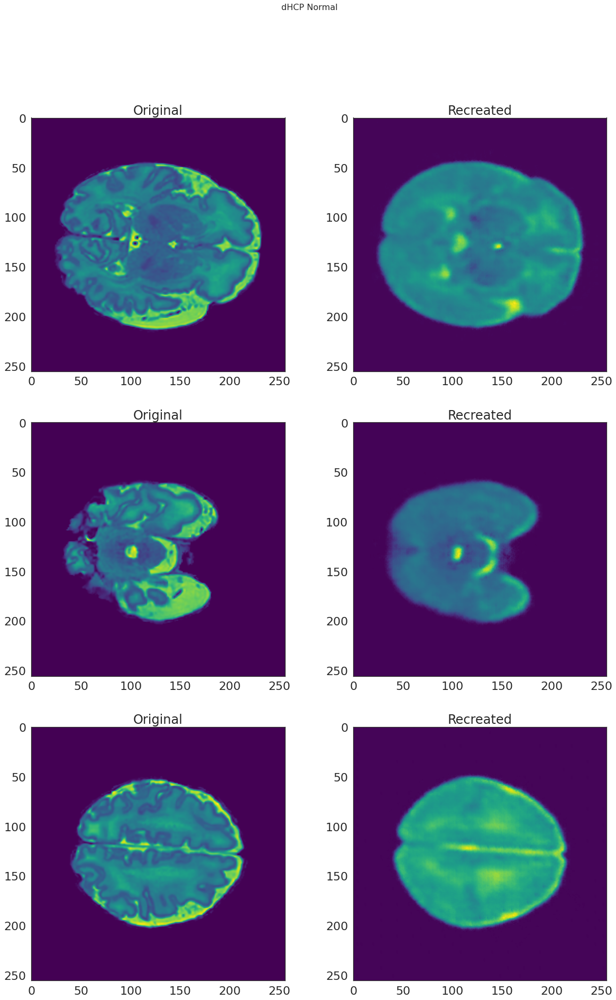

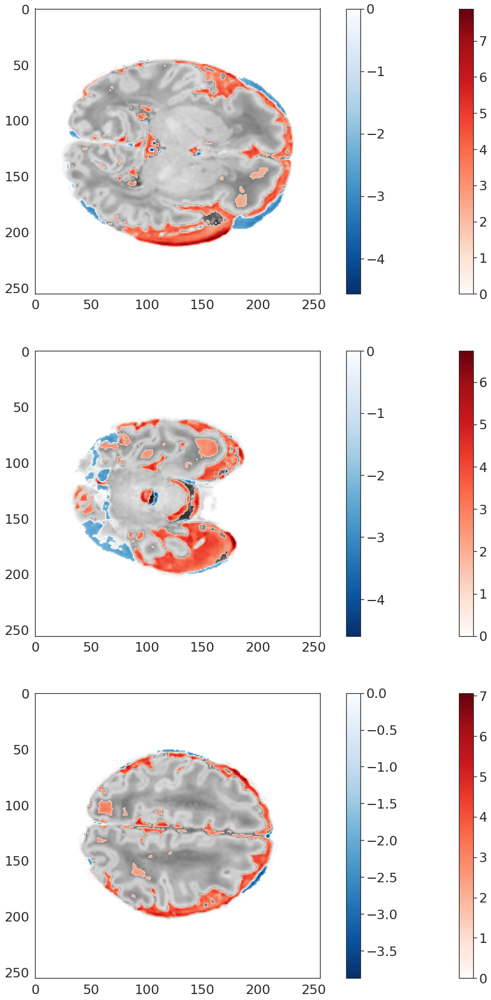

In [9]:
og_img, pred_img = viz_before_after(test[0], 'dHCP Normal')
brain_diff(og_img, pred_img, 2)

diff = og_img - pred_img
with open('/media/jraad/Data1/school/research/data/connected_components/diff_abnormal.npy', 'wb') as f:
    np.save(f, diff)

### New Viz

In [11]:
import math

reds = dict(enumerate((
    (188, 135, 135),
    (185, 129, 128),
    (182, 122, 121),
    (179, 116, 114),
    (176, 109, 107),
    (173, 103, 100),
    (170, 97, 94),
    (166, 90, 87),
    (163, 84, 80),
    (159, 77, 73),
    (155, 71, 66),
    (151, 65, 59),
    (147, 58, 52),
    (143, 52, 45),
    (139, 45, 39),
    (135, 38, 32),
    (130, 30, 25),
    (125, 22, 18),
    (121, 12, 10),
    (116, 0, 0)
)))
for key in reds:
    reds[key] = tuple(map(lambda x: x/255., reds[key]))

blues = dict(enumerate((
    (135, 141, 188),
    (128, 134, 185),
    (121, 127, 182),
    (115, 120, 178),
    (108, 113, 175),
    (101, 106, 172),
    (95, 99, 168),
    (89, 92, 165),
    (82, 85, 161),
    (76, 78, 157),
    (70, 71, 154),
    (64, 64, 150),
    (58, 57, 146),
    (51, 50, 142),
    (45, 43, 138),
    (38, 35, 134),
    (31, 28, 129),
    (23, 20, 125),
    (13, 10, 121),
    (0, 1, 116)
)))
for key in blues:
    blues[key] = tuple(map(lambda x: x/255., blues[key]))

rgb_og = np.stack((og_img,)*3, axis=-1)
diff_scaled = (diff - mean) / std

x, y, z = diff_scaled.shape
for i in range(0, x):
    for j in range(0, y):
        for k in range(0, z):
            val = int(diff_scaled[i,j,k])
            if val < 0:
                color = blues[abs(val)]
            else:
                color = reds[abs(val)]
            if abs(val) >= 3:
                rgb_og[i,j,k] = color

In [12]:
import plotly.express as px
from plotly.subplots import make_subplots

fig = px.imshow(rgb_og[:,:,128])#, color_continuous_scale='gray')
fig.show()

### Visualize Abnormal dHCP Data

(array([1.2466696e+07, 5.7424000e+04, 3.7113000e+04, 2.7818000e+04,
        2.2968000e+04, 2.0955000e+04, 2.3181000e+04, 3.9305000e+04,
        9.6027000e+04, 2.3116200e+05, 4.6307700e+05, 5.0191300e+05,
        3.7289800e+05, 2.9406700e+05, 2.7095700e+05, 2.6573200e+05,
        2.5632500e+05, 2.2340100e+05, 1.7334600e+05, 1.2547600e+05,
        8.9307000e+04, 6.4107000e+04, 4.6253000e+04, 3.5571000e+04,
        3.1062000e+04, 2.9280000e+04, 2.7923000e+04, 2.7523000e+04,
        2.7112000e+04, 2.7810000e+04, 2.8930000e+04, 3.0450000e+04,
        3.3631000e+04, 3.7305000e+04, 4.2417000e+04, 5.1999000e+04,
        6.1409000e+04, 5.2691000e+04, 3.2235000e+04, 1.7883000e+04,
        8.0900000e+03, 2.8830000e+03, 9.0800000e+02, 3.0600000e+02,
        1.4600000e+02, 7.2000000e+01, 3.2000000e+01, 1.9000000e+01,
        1.4000000e+01, 7.0000000e+00]),
 array([0.  , 0.02, 0.04, 0.06, 0.08, 0.1 , 0.12, 0.14, 0.16, 0.18, 0.2 ,
        0.22, 0.24, 0.26, 0.28, 0.3 , 0.32, 0.34, 0.36, 0.38, 0.4 , 0.

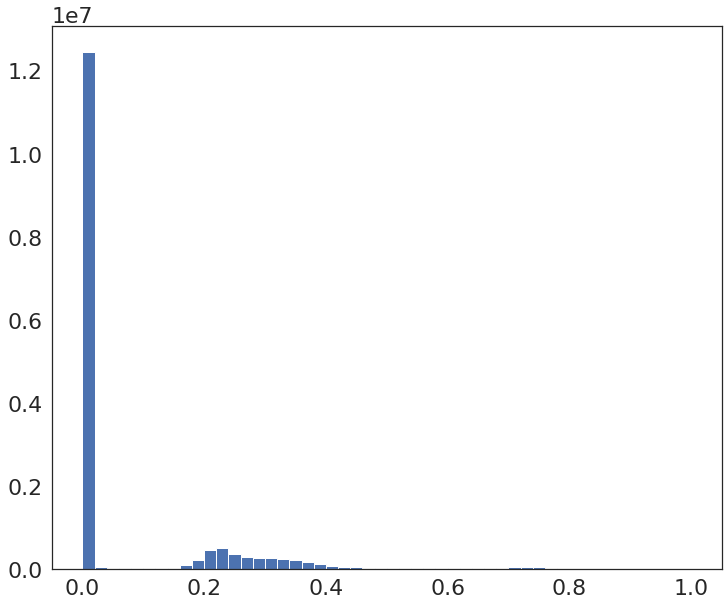

In [22]:
plt.hist(og_img.flatten(), bins=50)

(array([[0.0000000e+00, 0.0000000e+00, 1.0000000e+00, 1.0000000e+01,
         1.8000000e+01, 2.1000000e+01, 2.9000000e+01, 3.6000000e+01,
         6.7000000e+01, 8.5000000e+01, 1.3500000e+02, 1.7600000e+02,
         2.6300000e+02, 2.9300000e+02, 4.2700000e+02, 5.7400000e+02,
         8.3700000e+02, 1.1700000e+03, 1.6540000e+03, 2.0410000e+03,
         2.7210000e+03, 3.4610000e+03, 4.0920000e+03, 4.8510000e+03,
         5.7410000e+03, 6.9870000e+03, 8.7700000e+03, 1.1254000e+04,
         1.4489000e+04, 1.7623000e+04, 2.0797000e+04, 2.4392000e+04,
         2.9256000e+04, 3.4014000e+04, 4.1183000e+04, 4.9727000e+04,
         6.2282000e+04, 8.2162000e+04, 1.1701200e+05, 1.8033100e+05,
         2.7409100e+05, 3.7198900e+05, 1.2495526e+07, 3.5494200e+05,
         3.3678700e+05, 3.4555700e+05, 3.4750700e+05, 3.3911700e+05,
         2.9969800e+05, 2.2728600e+05, 1.5042100e+05, 9.4728000e+04,
         6.2453000e+04, 4.5882000e+04, 3.6140000e+04, 3.0550000e+04,
         2.6532000e+04, 2.3946000e

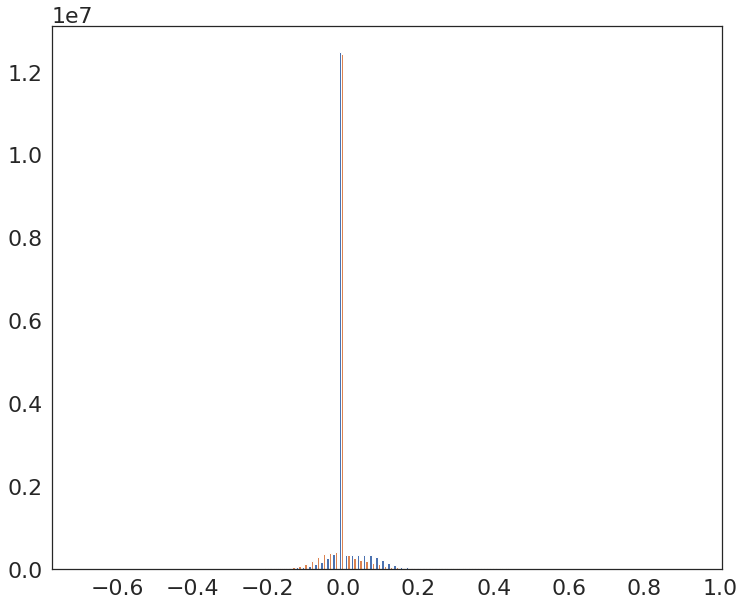

In [29]:
plt.hist([diff_healthy.flatten(), diff_abnormal.flatten()], bins=100)

(array([2.6000000e+01, 4.6000000e+01, 9.7000000e+01, 1.8600000e+02,
        3.8400000e+02, 6.4500000e+02, 1.1950000e+03, 2.3140000e+03,
        4.1040000e+03, 6.4260000e+03, 9.1900000e+03, 1.3188000e+04,
        2.0456000e+04, 3.2133000e+04, 4.4643000e+04, 6.1863000e+04,
        8.7921000e+04, 1.3685400e+05, 2.7242200e+05, 5.9002300e+05,
        1.2848974e+07, 6.5676700e+05, 6.7120000e+05, 5.6679200e+05,
        2.9510900e+05, 1.2727200e+05, 7.2615000e+04, 5.2879000e+04,
        4.3865000e+04, 3.7322000e+04, 3.0917000e+04, 2.4667000e+04,
        1.8773000e+04, 1.4162000e+04, 1.0033000e+04, 7.2350000e+03,
        5.0280000e+03, 3.3570000e+03, 2.3950000e+03, 1.6600000e+03,
        9.4900000e+02, 5.4700000e+02, 2.9700000e+02, 1.3300000e+02,
        6.7000000e+01, 3.3000000e+01, 3.0000000e+01, 1.3000000e+01,
        7.0000000e+00, 2.0000000e+00]),
 array([-0.6457293 , -0.6143095 , -0.58288974, -0.5514699 , -0.5200501 ,
        -0.48863032, -0.45721054, -0.42579073, -0.39437094, -0.36295113

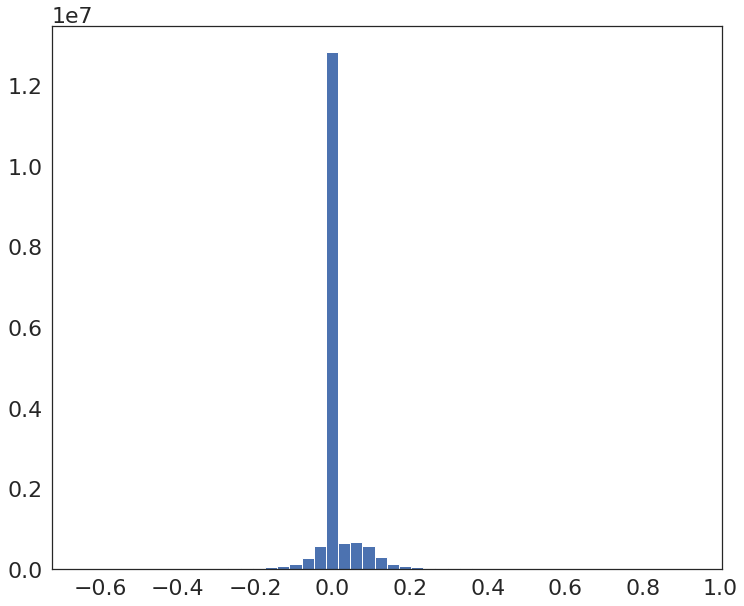

In [27]:
diff_abnormal = og_img - pred_img
plt.hist(diff.flatten(), bins=50)

In [30]:
std

0.058878187

NameError: name 'mean' is not defined

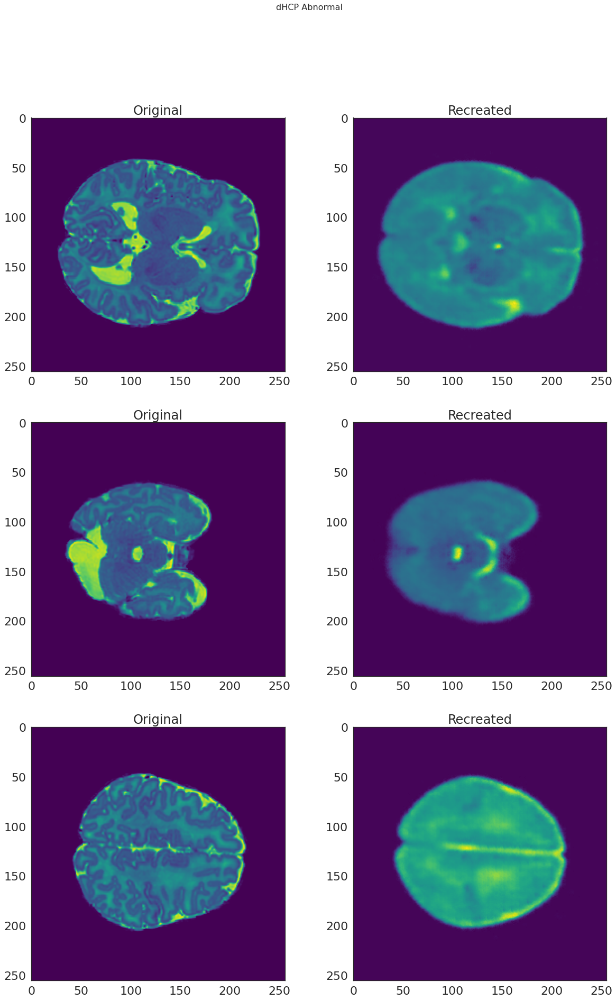

In [10]:
og_img = np.reshape(dhcp_abnormal[2], (x, y, z, 1))
og_img, pred_img = viz_before_after(og_img, 'dHCP Abnormal')
brain_diff(og_img, pred_img, 2, mean=mean, std=std)

### Punch a Sphere

In [9]:
def sphere(shape, radius, position):
    # assume shape and position are both a 3-tuple of int or float
    # the units are pixels / voxels (px for short)
    # radius is a int or float in px
    semisizes = (radius,) * 3

    # genereate the grid for the support points
    # centered at the position indicated by position
    grid = [slice(-x0, dim - x0) for x0, dim in zip(position, shape)]
    position = np.ogrid[grid]
    # calculate the distance of all points from `position` center
    # scaled by the radius
    arr = np.zeros(shape, dtype=float)
    for x_i, semisize in zip(position, semisizes):
        # this can be generalized for exponent != 2
        # in which case `(x_i / semisize)`
        # would become `np.abs(x_i / semisize)`
        arr += (x_i / semisize) ** 2

    # the inner part of the sphere will have distance below 1
    return arr <= 1.0

In [11]:
# Normal

arr = sphere((256, 256, 256), 5, (200, 127, 127))

og_img_punch = dhcp_normal[0].copy()
og_img_punch[arr] = 0.8

x, y, z = og_img.shape
og_img = np.reshape(og_img_punch, (x, y, z, 1))
og_img, pred_img = viz_before_after(og_img, 'dHCP Normal')
brain_diff(og_img, pred_img, 2, mean=mean, std=std)

NameError: name 'sphere' is not defined

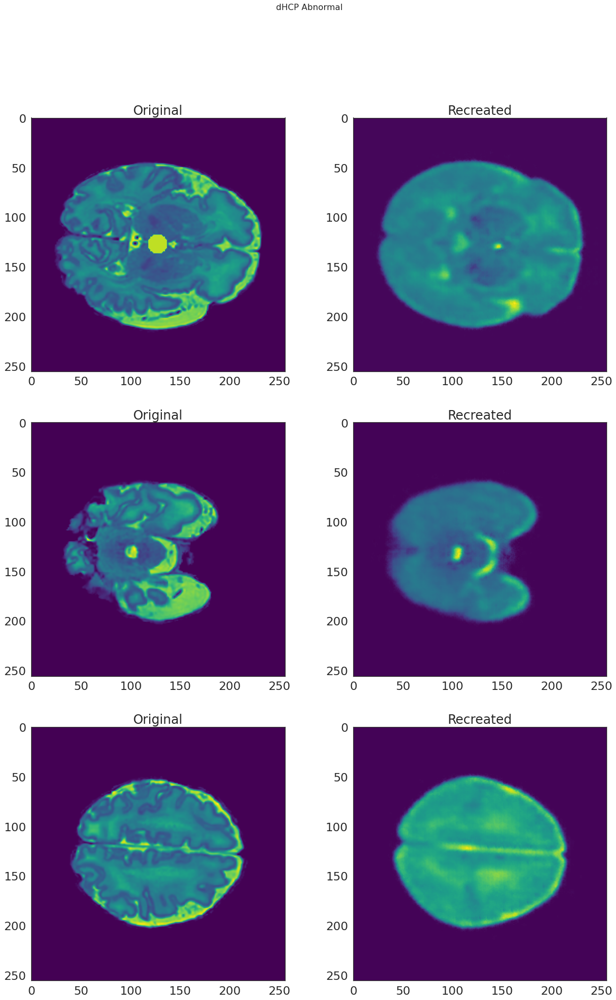

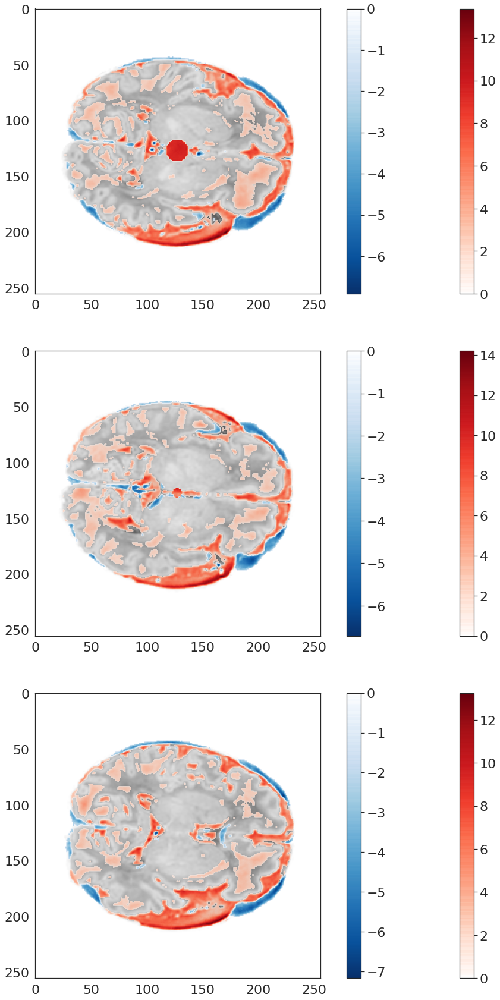

In [29]:
# Abnormal

arr = sphere((256, 256, 256), 10, (127, 127, 127))

og_img_punch = dhcp_abnormal[0].copy()
og_img_punch[arr] = 0.8

x, y, z = og_img.shape
og_img = np.reshape(og_img_punch, (x, y, z, 1))
og_img, pred_img = viz_before_after(og_img, 'dHCP Abnormal')
brain_diff(og_img, pred_img, 2, mean=mean, std=std)

In [20]:
og_img.shape

(256, 256, 256)

In [28]:

def brain_diff(a, b, threshold=3, mean=0, std=0.1):
    ncolors = 256
    
    x, y, z = a.shape
    z_plot = ceil(z / 2)
    
    diff = a - b
    
    diff_scaled = (diff - mean) / std
    
    # Values that fall below the mean/threshold
    below_zero = diff_scaled.copy()
    below_zero[below_zero > -threshold] = 0

    # Values that fall above the mean/threshold
    above_zero = diff_scaled.copy()
    above_zero[above_zero < threshold] = 0
    
    # Log-ish Alpha scale
    color_alpha = alpha_curve(ncolors)
    
    # Above mean colormap
    color_array = plt.get_cmap('Reds')(range(ncolors))
    color_array[:,-1] = color_alpha
    map_object = LinearSegmentedColormap.from_list(name='above_mean',colors=color_array)
    plt.register_cmap(cmap=map_object)

    # Above mean colormap
    color_array = plt.get_cmap('Blues')(range(ncolors))
    color_array = np.flip(color_array, axis=0)
    color_array[:,-1] = np.flip(color_alpha) #np.linspace(1.0,0.0,ncolors)
    map_object = LinearSegmentedColormap.from_list(name='below_mean',colors=color_array)
    plt.register_cmap(cmap=map_object)
    
    # Define plots
    fig, ax = plt.subplots(3, 1, figsize=(20, 30))
    
    # Plot middle slice
    index = 0
    ax[index].imshow(a[:,:,z_plot], cmap='Greys')
    im = ax[index].imshow(above_zero[:,:,z_plot], cmap='above_mean')
    fig.colorbar(im, ax=ax[index])
    im = ax[index].imshow(below_zero[:,:,z_plot], cmap='below_mean')
    fig.colorbar(im, ax=ax[index])
    
    # Plot early slice
    z_plot = 128 - 10
    index = 1
    ax[index].imshow(a[:,:,z_plot], cmap='Greys')
    im = ax[index].imshow(above_zero[:,:,z_plot], cmap='above_mean')
    fig.colorbar(im, ax=ax[index])
    im = ax[index].imshow(below_zero[:,:,z_plot], cmap='below_mean')
    fig.colorbar(im, ax=ax[index])
    
    # Plot late slice
    z_plot = 128 + 10
    index = 2
    ax[index].imshow(a[:,:,z_plot], cmap='Greys')
    im = ax[index].imshow(above_zero[:,:,z_plot], cmap='above_mean')
    fig.colorbar(im, ax=ax[index])
    im = ax[index].imshow(below_zero[:,:,z_plot], cmap='below_mean')
    fig.colorbar(im, ax=ax[index])